In [1]:
%matplotlib inline
# %matplotlib widget

In [2]:
import kagglehub
import shutil
import os

# 1. Download dataset (KaggleHub cache folder)
path = kagglehub.dataset_download("dylanjcastillo/7k-books-with-metadata")
print("Downloaded to:", path)

# 2. Your working directory
target_dir = r"D:\Projects\Semantic_book_recommender\data\raw"   # target
os.makedirs(target_dir, exist_ok=True)

# 3. Copy dataset files to your folder
for file in os.listdir(path):
    src = os.path.join(path, file)
    dst = os.path.join(target_dir, file)
    shutil.copy(src, dst)

print("Copied to:", target_dir)

# 4. Delete original dataset folder from KaggleHub cache
shutil.rmtree(path)
print("Deleted original cache folder:", path)


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.47M/1.47M [00:01<00:00, 1.06MB/s]

Extracting files...
Downloaded to: C:\Users\prana\.cache\kagglehub\datasets\dylanjcastillo\7k-books-with-metadata\versions\3
Copied to: D:\Projects\Semantic_book_recommender\data\raw
Deleted original cache folder: C:\Users\prana\.cache\kagglehub\datasets\dylanjcastillo\7k-books-with-metadata\versions\3


In [3]:
import pandas as pd
books = pd.read_csv(f"{target_dir}/books.csv")

In [4]:
from ydata_profiling import ProfileReport

profile = ProfileReport(books)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 19.91it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

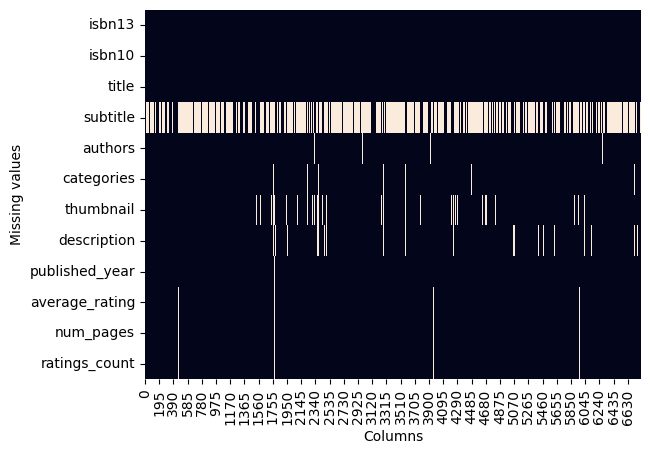

In [6]:
ax = plt.axes()
sns.heatmap(books.isna().transpose(),cbar = False, ax=ax)
plt.xlabel("Columns")
plt.ylabel("Missing values")
plt.show()

In [7]:
import numpy as np

#checking books with missing description (1 - description is missing, 0 - otherwise)
books["missing_description"] = np.where(books["description"].isna(), 1, 0)

#checking the age of books wrt to 2025
books["age_of_books"] = 2025 - books["published_year"]

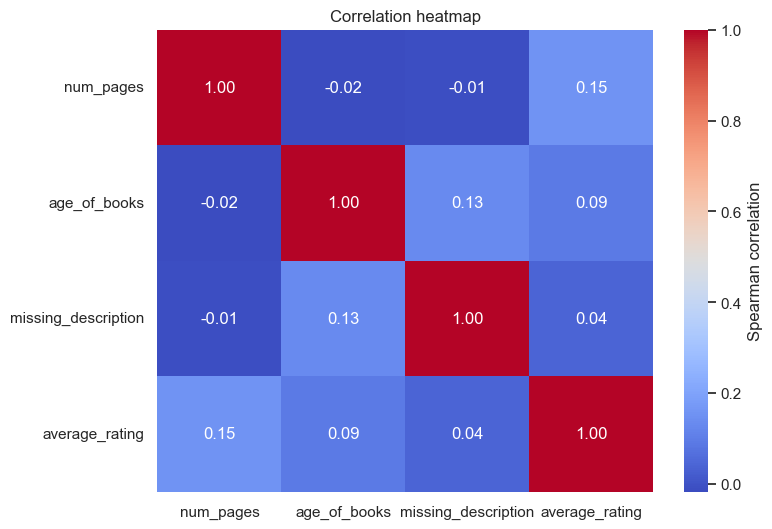

In [8]:
columns_of_interest = ["num_pages", "age_of_books", "missing_description", "average_rating"]
correlation_matrix = books[columns_of_interest].corr(method = "spearman")#spearman cuz missing_description is a binary field

sns.set_theme(style = "white")
plt.figure(figsize=(8,6))
heatmap = sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={"label":"Spearman correlation"})
heatmap.set_title("Correlation heatmap")
plt.show()


In [9]:
#finding out percentage of  books having a missing description or num_pages or  average_rating or published_year
missing_rows = books[(books["description"].isna())|
    (books["num_pages"].isna()) | 
    (books["average_rating"].isna()) | 
    (books["published_year"].isna())
    ]

percent_miss  = (len(missing_rows)/len(books)) * 100
print(f"Percentage of missing data wrt to the entire dataset is {percent_miss}")

Percentage of missing data wrt to the entire dataset is 4.4493392070484585


In [10]:
new_books =  books[(~books["description"].isna()) &
    ~(books["num_pages"].isna()) &
    ~(books["average_rating"].isna()) & 
    ~(books["published_year"].isna())
    ].copy()

new_books

,isbn13,isbn10,title,subtitle,authors,categories,thumbnail,description,published_year,average_rating,num_pages,ratings_count,missing_description,age_of_books
0,9780002005883,0002005883,Gilead,NaN,Marilynne Robinson,Fiction,http://books.google.com/books/content?id=KQZCP...,A NOVEL THAT READERS and critics have been eag...,2004.0,3.85,247.0,361.0,0,21.0
1,9780002261982,0002261987,Spider's Web,A Novel,Charles Osborne;Agatha Christie,Detective and mystery stories,http://books.google.com/books/content?id=gA5GP...,A new 'Christie for Christmas' -- a full-lengt...,2000.0,3.83,241.0,5164.0,0,25.0
2,9780006163831,0006163831,The One Tree,NaN,Stephen R. Donaldson,American fiction,http://books.google.com/books/content?id=OmQaw...,Volume Two of Stephen Donaldson's acclaimed se...,1982.0,3.97,479.0,172.0,0,43.0
3,9780006178736,0006178731,Rage of angels,NaN,Sidney Sheldon,Fiction,http://books.google.com/books/content?id=FKo2T...,"A memorable, mesmerizing heroine Jennifer -- b...",1993.0,3.93,512.0,29532.0,0,32.0
4,9780006280897,0006280897,The Four Loves,NaN,Clive Staples Lewis,Christian life,http://books.google.com/books/content?id=XhQ5X...,Lewis' work on the nature of love divides love...,2002.0,4.15,170.0,33684.0,0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6803,9788173031014,8173031010,Journey to the East,NaN,Hermann Hesse,Adventure stories,http://books.google.com/books/content?id=rq6JP...,This book tells the tale of a man who goes on ...,2002.0,3.70,175.0,24.0,0,23.0
6804,9788179921623,817992162X,The Monk Who Sold His Ferrari: A Fable About F...,NaN,Robin Sharma,Health & Fitness,http://books.google.com/books/content?id=c_7mf...,"Wisdom to Create a Life of Passion, Purpose, a...",2003.0,3.82,198.0,1568.0,0,22.0
6805,9788185300535,8185300534,I Am that,Talks with Sri Nisargadatta Maharaj,Sri Nisargadatta Maharaj;Sudhakar S. Dikshit,Philosophy,http://books.google.com/books/content?id=Fv_JP...,This collection of the timeless teachings of o...,1999.0,4.51,531.0,104.0,0,26.0
6808,9789027712059,9027712050,The Berlin Phenomenology,NaN,Georg Wilhelm Friedrich Hegel,History,http://books.google.com/books/content?id=Vy7Sk...,Since the three volume edition ofHegel's Philo...,1981.0,0.00,210.0,0.0,0,44.0


In [11]:
profile = ProfileReport(new_books)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 16.00it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
import plotly.express as px
new_books["categories"].value_counts().reset_index().sort_values("count", ascending = False).head(50)

,categories,count
0,Fiction,2523
1,Juvenile Fiction,534
2,Biography & Autobiography,391
3,History,258
4,Literary Criticism,164
5,Philosophy,154
6,Comics & Graphic Novels,152
7,Religion,136
8,Drama,126
9,Juvenile Nonfiction,114


In [13]:
new_books["words_in_description"] = new_books["description"].str.split().str.len()
new_books[["words_in_description"]]
#description with highest number of words.
#new_books.loc[new_books["words_in_description"].idxmax()]
longest_description = new_books.loc[
    new_books["words_in_description"].idxmax(), 
    "description"
]

longest_description


'Life at the end of the twentieth century presents us with a disturbing reality. Otherness, the simple fact of being different in some way, has come to be defined as in and of itself evil. Miroslav Volf contends that if the healing word of the gospel is to be heard today, Christian theology must find ways of speaking that address the hatred of the other. Reaching back to the New Testament metaphor of salvation as reconciliation, Volf proposes the idea of embrace as a theological response to the problem of exclusion. Increasingly we see that exclusion has become the primary sin, skewing our perceptions of reality and causing us to react out of fear and anger to all those who are not within our (ever-narrowing) circle. In light of this, Christians must learn that salvation comes, not only as we are reconciled to God, and not only as we "learn to live with one another," but as we take the dangerous and costly step of opening ourselves to the other, of enfolding him or her in the same embr

In [14]:
#description with highest number of words.
#new_books.loc[new_books["words_in_description"].idxmax()]
shortest_description = new_books.loc[
    new_books["words_in_description"].idxmin(), 
    "description"
]

shortest_description

'Donation.'

In [15]:
import plotly.express as px

fig = px.histogram(
    new_books,
    x="words_in_description",
    nbins=1000,                     
    title="Distribution of Words in Description",
    labels={"words_in_description": "Word Count"},
    opacity=0.8
)

fig.update_layout(
    bargap=0.1,
    plot_bgcolor="black",
    paper_bgcolor="black",
    font_color="white",
    height=500
)

fig.show()


In [16]:
#so how many words are required inorder to make the description meaningful
new_books.loc[new_books["words_in_description"].between(1,4),"description"]# no useful meaning can be derived.

6                                           Donation.
11                                     Fantasy-roman.
748              Includes bibliographical references.
770                             Bound For Oregon (PB)
775                                No Marketing Blurb
812                                No Marketing Blurb
857                          First published in 1813.
944                         Edited by Maurice Hindle.
953                        DEFOE/ROBINSON CRUSOE (BC)
954                             Edited by John Carey.
962                         ALLEN/GETTING THINGS DONE
1054                            GILBERT/EAT PRAY LOVE
1056    "Graham Greene centennial, 1904-2004"--Cover.
1060                   STEINBECK/GRAPES OF WRATH (BC)
1346                                   Fantasy-roman.
1546                                      Winter 2003
1610                                      Winter 1999
1813                             National bestseller.
1981                        

In [17]:
new_books.loc[new_books["words_in_description"].between(4,15),"description"]# no useful meaning can be derived.

2       Volume Two of Stephen Donaldson's acclaimed se...
38      Koko is Peter Straub's foray into the psycholo...
70      A matter of life and death - and the Throne of...
77                         Nonsense rhyming story. 4 yrs+
83      Tie your tongue in terrible knots as you try t...
                              ...                        
6730    Nineteen writers dig into the spaces between g...
6757                          Audio Book- unabriged on CD
6767    Everything from the fingerprints of the gods t...
6776    Raymond Chandler meets The Exorcist. Classic n...
6795    Book Of Five Rings is a Kodansha International...
Name: description, Length: 408, dtype: object

In [18]:
new_books.loc[new_books["words_in_description"].between(15,24),"description"]# no useful meaning can be derived.

10      One of Sidney Sheldon's most popular and bests...
32      Tells the story of three generations of Chines...
36      A magical and fantastic collection of early st...
57      A young drifter finds more than he bargained f...
68      A new 'The Doors of Perception' for the 21st c...
                              ...                        
6767    Everything from the fingerprints of the gods t...
6782    Displays one of America's leading physicist's ...
6783    Basics Illustration 01: Thinking Visually expl...
6789    Provides an introduction to the American artis...
6809    This is a jubilant and rewarding collection of...
Name: description, Length: 947, dtype: object

In [19]:
new_books.loc[new_books["words_in_description"].between(25,34),"description"]#so now we can remove all those having less than 25 words in the description.
#atleast 25 words is required in the description to actually make some sense.

9       Kate Blackwell is an enigma and one of the mos...
14      Available in the U.S. for the first time, this...
20      It is 1937, and Charles Ashworth, a Canon to t...
21      Reissue of the author's most famous and well-l...
46      No one believes a little girl when she insists...
                              ...                        
6760    Joel, an English teacher, has never really lik...
6766    Discusses the historical and intellectual back...
6775    Presents nearly one thousand recipes--from app...
6779    Edited by the creator and executive producer o...
6799    This book is the story of a young girl obsesse...
Name: description, Length: 1229, dtype: object

In [20]:
new_books_25_words = new_books[new_books["words_in_description"]>=25].copy()

In [21]:
new_books_25_words

,isbn13,isbn10,title,subtitle,authors,categories,thumbnail,description,published_year,average_rating,num_pages,ratings_count,missing_description,age_of_books,words_in_description
0,9780002005883,0002005883,Gilead,NaN,Marilynne Robinson,Fiction,http://books.google.com/books/content?id=KQZCP...,A NOVEL THAT READERS and critics have been eag...,2004.0,3.85,247.0,361.0,0,21.0,199
1,9780002261982,0002261987,Spider's Web,A Novel,Charles Osborne;Agatha Christie,Detective and mystery stories,http://books.google.com/books/content?id=gA5GP...,A new 'Christie for Christmas' -- a full-lengt...,2000.0,3.83,241.0,5164.0,0,25.0,205
3,9780006178736,0006178731,Rage of angels,NaN,Sidney Sheldon,Fiction,http://books.google.com/books/content?id=FKo2T...,"A memorable, mesmerizing heroine Jennifer -- b...",1993.0,3.93,512.0,29532.0,0,32.0,57
4,9780006280897,0006280897,The Four Loves,NaN,Clive Staples Lewis,Christian life,http://books.google.com/books/content?id=XhQ5X...,Lewis' work on the nature of love divides love...,2002.0,4.15,170.0,33684.0,0,23.0,45
5,9780006280934,0006280935,The Problem of Pain,NaN,Clive Staples Lewis,Christian life,http://books.google.com/books/content?id=Kk-uV...,"""In The Problem of Pain, C.S. Lewis, one of th...",2002.0,4.09,176.0,37569.0,0,23.0,75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6802,9788172235222,8172235224,Mistaken Identity,NaN,Nayantara Sahgal,Indic fiction (English),http://books.google.com/books/content?id=q-tKP...,On A Train Journey Home To North India After L...,2003.0,2.93,324.0,0.0,0,22.0,288
6803,9788173031014,8173031010,Journey to the East,NaN,Hermann Hesse,Adventure stories,http://books.google.com/books/content?id=rq6JP...,This book tells the tale of a man who goes on ...,2002.0,3.70,175.0,24.0,0,23.0,63
6804,9788179921623,817992162X,The Monk Who Sold His Ferrari: A Fable About F...,NaN,Robin Sharma,Health & Fitness,http://books.google.com/books/content?id=c_7mf...,"Wisdom to Create a Life of Passion, Purpose, a...",2003.0,3.82,198.0,1568.0,0,22.0,117
6805,9788185300535,8185300534,I Am that,Talks with Sri Nisargadatta Maharaj,Sri Nisargadatta Maharaj;Sudhakar S. Dikshit,Philosophy,http://books.google.com/books/content?id=Fv_JP...,This collection of the timeless teachings of o...,1999.0,4.51,531.0,104.0,0,26.0,174


In [22]:
percent_lost = (len(new_books) - len(new_books_25_words)) / len(new_books) * 100
print(f"percentage of data lost is {percent_lost}")

percentage of data lost is 20.132165360381126


In [23]:
new_books_25_words.shape

(5197, 15)

In [24]:
#title column has 0 missing values

In [25]:
#combine the title and subtitle.
new_books_25_words["title_and_subtitle"] = (np.where(new_books_25_words["subtitle"].isna(), new_books_25_words["title"],
                                                    new_books_25_words[["title", "subtitle"]].astype(str).agg(": ".join, axis=1))
    
)

new_books_25_words.head(5)

,isbn13,isbn10,title,subtitle,authors,categories,thumbnail,description,published_year,average_rating,num_pages,ratings_count,missing_description,age_of_books,words_in_description,title_and_subtitle
0,9780002005883,0002005883,Gilead,NaN,Marilynne Robinson,Fiction,http://books.google.com/books/content?id=KQZCP...,A NOVEL THAT READERS and critics have been eag...,2004.0,3.85,247.0,361.0,0,21.0,199,Gilead
1,9780002261982,0002261987,Spider's Web,A Novel,Charles Osborne;Agatha Christie,Detective and mystery stories,http://books.google.com/books/content?id=gA5GP...,A new 'Christie for Christmas' -- a full-lengt...,2000.0,3.83,241.0,5164.0,0,25.0,205,Spider's Web: A Novel
3,9780006178736,0006178731,Rage of angels,NaN,Sidney Sheldon,Fiction,http://books.google.com/books/content?id=FKo2T...,"A memorable, mesmerizing heroine Jennifer -- b...",1993.0,3.93,512.0,29532.0,0,32.0,57,Rage of angels
4,9780006280897,0006280897,The Four Loves,NaN,Clive Staples Lewis,Christian life,http://books.google.com/books/content?id=XhQ5X...,Lewis' work on the nature of love divides love...,2002.0,4.15,170.0,33684.0,0,23.0,45,The Four Loves
5,9780006280934,0006280935,The Problem of Pain,NaN,Clive Staples Lewis,Christian life,http://books.google.com/books/content?id=Kk-uV...,"""In The Problem of Pain, C.S. Lewis, one of th...",2002.0,4.09,176.0,37569.0,0,23.0,75,The Problem of Pain


In [26]:
#adding isbn to the description so that later we can use it to find the recommended book info by matching isbn rather than using desc
# to do the matching which is messy.
new_books_25_words["tagged_description"] = new_books_25_words[["isbn13", "description"]].astype(str).agg(" ".join, axis = 1)
new_books_25_words.head(5)

,isbn13,isbn10,title,subtitle,authors,categories,thumbnail,description,published_year,average_rating,num_pages,ratings_count,missing_description,age_of_books,words_in_description,title_and_subtitle,tagged_description
0,9780002005883,0002005883,Gilead,NaN,Marilynne Robinson,Fiction,http://books.google.com/books/content?id=KQZCP...,A NOVEL THAT READERS and critics have been eag...,2004.0,3.85,247.0,361.0,0,21.0,199,Gilead,9780002005883 A NOVEL THAT READERS and critics...
1,9780002261982,0002261987,Spider's Web,A Novel,Charles Osborne;Agatha Christie,Detective and mystery stories,http://books.google.com/books/content?id=gA5GP...,A new 'Christie for Christmas' -- a full-lengt...,2000.0,3.83,241.0,5164.0,0,25.0,205,Spider's Web: A Novel,9780002261982 A new 'Christie for Christmas' -...
3,9780006178736,0006178731,Rage of angels,NaN,Sidney Sheldon,Fiction,http://books.google.com/books/content?id=FKo2T...,"A memorable, mesmerizing heroine Jennifer -- b...",1993.0,3.93,512.0,29532.0,0,32.0,57,Rage of angels,"9780006178736 A memorable, mesmerizing heroine..."
4,9780006280897,0006280897,The Four Loves,NaN,Clive Staples Lewis,Christian life,http://books.google.com/books/content?id=XhQ5X...,Lewis' work on the nature of love divides love...,2002.0,4.15,170.0,33684.0,0,23.0,45,The Four Loves,9780006280897 Lewis' work on the nature of lov...
5,9780006280934,0006280935,The Problem of Pain,NaN,Clive Staples Lewis,Christian life,http://books.google.com/books/content?id=Kk-uV...,"""In The Problem of Pain, C.S. Lewis, one of th...",2002.0,4.09,176.0,37569.0,0,23.0,75,The Problem of Pain,"9780006280934 ""In The Problem of Pain, C.S. Le..."


In [27]:
#clean and save the dataset
new_books_25_words.drop(["subtitle", "missing_description", "age_of_books", "words_in_description"], axis = 1).to_csv(r"D:\Projects\Semantic_book_recommender\data\processed\books.csv", index = False)